In [4]:
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors
import time
import sys
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans
import seaborn as sns
import random

random.seed(10)


def get_windows(job,n_neighbors):
    '''
    For each region and each individual cell in dataset, return the indices of the nearest neighbors.
    
    'job:  meta data containing the start time,index of region, region name, indices of region in original dataframe
    n_neighbors:  the number of neighbors to find for each cell
    '''
    start_time,idx,tissue_name,indices = job
    job_start = time.time()
    
    print ("Starting:", str(idx+1)+'/'+str(len(exps)),': ' + exps[idx])

    tissue = tissue_group.get_group(tissue_name)
    to_fit = tissue.loc[indices][[X,Y]].values

#     fit = NearestNeighbors(n_neighbors=n_neighbors+1).fit(tissue[[X,Y]].values)
    fit = NearestNeighbors(n_neighbors=n_neighbors).fit(tissue[[X,Y]].values)
    m = fit.kneighbors(to_fit)
#     m = m[0][:,1:], m[1][:,1:]
    m = m[0], m[1]
    

    #sort_neighbors
    args = m[0].argsort(axis = 1)
    add = np.arange(m[1].shape[0])*m[1].shape[1]
    sorted_indices = m[1].flatten()[args+add[:,None]]

    neighbors = tissue.index.values[sorted_indices]
   
    end_time = time.time()
   
    print ("Finishing:", str(idx+1)+"/"+str(len(exps)),": "+ exps[idx],end_time-job_start,end_time-start_time)
    return neighbors.astype(np.int32)

   

In [5]:
ks = [5,10,20] # k=5 means it collects 5 nearest neighbors for each center cell
path_to_data = 'csv.csv' #CA the name does not matter here other than .csv extention, we will read and combine data in the cell below
X = 'X:X'
Y = 'Y:Y'
reg = 'File Name'
file_type = 'csv'

cluster_col = 'ClusterName'
keep_cols = [X,Y,reg,cluster_col]
save_path = ''

In [7]:
#read in data and do some quick data rearrangement
n_neighbors = max(ks)
assert (file_type=='csv' or file_type =='pickle') #


if file_type == 'pickle':
    cells = pd.read_pickle(path_to_data)
if file_type == 'csv':
    #CA read data to be combined
    cells1 = pd.read_csv('G3-PCa_dfmerged_Nolan-names_0904.csv')
    cells1_90 = cells1.sample(frac=0.90)
    cells2 = pd.read_csv('G4-PCa_dfmerged_Nolan-names_0904.csv')
    cells2_90 = cells2.sample(frac=0.90)
    cells3 = pd.read_csv('TAN-PCa_dfmerged_Nolan-names_0904.csv')
    cells3_90 = cells3.sample(frac=0.90)
    
    #CA combine all data read with the next to line
cells_3groups = [cells1_90, cells2_90, cells3_90]
cells_all = pd.concat(cells_3groups)

cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)

cells = cells.reset_index() #Uncomment this line if you do any subsetting of dataframe such as removing dirt etc or will throw error at end of next next code block (cell 6)

sum_cols = cells[cluster_col].unique()
values = cells[sum_cols].values
list(cells['patients'].unique())

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/1690589355.py:21: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)


[13, 9, 10, 12, 11, 4, 6, 7, 5, 8, 1, 2, 3]

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:23: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)


Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3805427551269531 0.38121557235717773
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06347799301147461 0.46047377586364746
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.12812089920043945 0.5931940078735352
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.332226037979126 0.9280991554260254
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.244826078414917 1.1797847747802734
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.25335121154785156 1.4392330646514893
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2694988250732422 1.713411808013916
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.49999523162841797 2.2185909748077393
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.016076087951660156 2.2455859184265137
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05001330375671387 2.30013108253479
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3125882148742676 2.6135339736938477
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4140002727508545 0.4147040843963623
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06338691711425781 0.4902458190917969
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1356201171875 0.630242109298706
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3958268165588379 1.0282957553863525
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2994387149810791 1.3371639251708984
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2729959487915039 1.6169350147247314
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2875540256500244 1.9096670150756836
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6724898815155029 2.587716817855835
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01653909683227539 2.615226984024048
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05312609672546387 2.6732230186462402
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.35236382484436035 3.0264248847961426
Starting: 9/13 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4202849864959717 0.42098379135131836
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06690716743469238 0.5034689903259277
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13559818267822266 0.6439549922943115
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3781239986419678 1.024665117263794
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2588469982147217 1.291100025177002
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2493901252746582 1.5469839572906494
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2758018970489502 1.827666997909546
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5788719654083252 2.411562919616699
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.017187118530273438 2.439532995223999
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05336308479309082 2.4979491233825684
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.34078478813171387 2.839531660079956
Starting: 7/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.37485313415527344 0.3755612373352051
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06184887886047363 0.44965076446533203
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1314249038696289 0.5855159759521484
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.337479829788208 0.9254131317138672
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2530529499053955 1.1856439113616943
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2552790641784668 1.4472520351409912
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2835540771484375 1.7355461120605469
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5107190608978271 2.2521491050720215
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016378164291381836 2.279688835144043
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05016922950744629 2.3344759941101074
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3098170757293701 2.645066022872925
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3739509582519531 0.3747236728668213
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06389808654785156 0.45096707344055176
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13229107856750488 0.587482213973999
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.32508373260498047 0.9150829315185547
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24186015129089355 1.166666030883789
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2498021125793457 1.4225900173187256
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2701380252838135 1.6971988677978516
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5690529346466064 2.2717978954315186
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016414165496826172 2.2991549968719482
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05431413650512695 2.358746290206909
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.31470489501953125 2.6742191314697266
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.38115811347961426 0.3818342685699463
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.0628957748413086 0.45801687240600586
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.12827396392822266 0.5903909206390381
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3260977268218994 0.9185037612915039
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2433316707611084 1.167754888534546
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25201988220214844 1.4257678985595703
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2685108184814453 1.6989109516143799
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5041141510009766 2.208153009414673
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.016668081283569336 2.2360520362854004
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.050409793853759766 2.2907047271728516
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3218879699707031 2.613342046737671
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.38399505615234375 0.3846709728240967
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06031608581542969 0.45707106590270996
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.12891769409179688 0.5910217761993408
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33685803413391113 0.9303090572357178
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24256086349487305 1.1792938709259033
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.25809478759765625 1.4435007572174072
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2678089141845703 1.7158737182617188
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4993438720703125 2.2206318378448486
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.01584601402282715 2.247220039367676
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0506739616394043 2.302258014678955
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.29756903648376465 2.600616931915283
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3622441291809082 0.3628971576690674
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06028628349304199 0.4353792667388916
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.1286311149597168 0.5682191848754883
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.32708191871643066 0.8977100849151611
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.24027085304260254 1.1447429656982422
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2542719841003418 1.4050936698913574
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2724940776824951 1.6820719242095947
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5245368480682373 2.211674928665161
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016191959381103516 2.2398781776428223
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05120682716369629 2.2959017753601074
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.30002403259277344 2.596737861633301
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3641340732574463 0.36478185653686523
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06068110466003418 0.43686509132385254
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.12749695777893066 0.5682938098907471
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.33396029472351074 0.9044170379638672
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.250201940536499 1.1619000434875488
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.249068021774292 1.4169039726257324
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2713348865509033 1.6927258968353271
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.507951021194458 2.2056310176849365
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016295194625854492 2.23358416557312
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.054602861404418945 2.29233980178833
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.3035550117492676 2.596668004989624
Starting: 7/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36590003967285156 0.3665449619293213
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06262493133544922 0.4404728412628174
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1294257640838623 0.5742106437683105
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32927727699279785 0.9055449962615967
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24429535865783691 1.1582942008972168
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2538297176361084 1.4180376529693604
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.269672155380249 1.692021131515503
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5010979175567627 2.197942018508911
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01598191261291504 2.223918914794922
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05022096633911133 2.2783620357513428
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3053569793701172 2.5844860076904297
Starting: 8

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36640310287475586 0.36705923080444336
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06113100051879883 0.4396519660949707
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.12906503677368164 0.573173999786377
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.333111047744751 0.908729076385498
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24270915985107422 1.1608331203460693
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2541069984436035 1.4209680557250977
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.269608736038208 1.6951358318328857
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49930596351623535 2.199901819229126
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.016485929489135742 2.2273008823394775
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05237412452697754 2.2840518951416016
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.30228090286254883 2.5871357917785645
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.38457202911376953 0.385267972946167
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06299519538879395 0.4598221778869629
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13626599311828613 0.6000440120697021
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.35359787940979004 0.9559338092803955
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2524838447570801 1.217167854309082
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.26428914070129395 1.487360954284668
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2787740230560303 1.7708611488342285
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6939337253570557 2.470315933227539
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01756596565246582 2.5001440048217773
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05204415321350098 2.558336019515991
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.31101417541503906 2.870103120803833
Starting: 6

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.38598012924194336 0.3866701126098633
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06397175788879395 0.46184778213500977
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1332111358642578 0.5991899967193604
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.34306979179382324 0.9444129467010498
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.25102996826171875 1.2040090560913086
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2699131965637207 1.4800193309783936
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2852518558502197 1.7705998420715332
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5319550037384033 2.3075897693634033
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017024993896484375 2.3351151943206787
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.053879737854003906 2.3934147357940674
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.32424116134643555 2.718358039855957
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38268589973449707 0.3836939334869385
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06499505043029785 0.4626932144165039
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.13551926612854004 0.6027030944824219
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.35439467430114746 0.9593079090118408
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2565279006958008 1.2247328758239746
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.26466989517211914 1.4957160949707031
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.28191304206848145 1.7823259830474854
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5393450260162354 2.3266849517822266
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017429113388061523 2.354527235031128
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05337190628051758 2.4121248722076416
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.31839418411254883 2.731267213821411
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3663599491119385 0.36701512336730957
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06085920333862305 0.4398791790008545
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13110804557800293 0.5759608745574951
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.33446311950683594 0.912804126739502
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24441909790039062 1.16355299949646
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2533440589904785 1.4228479862213135
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.27774596214294434 1.7055151462554932
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5131819248199463 2.223900079727173
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.015918970108032227 2.2507262229919434
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05074477195739746 2.3062379360198975
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3160519599914551 2.623059034347534
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3800010681152344 0.38069820404052734
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06829166412353516 0.46276187896728516
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12911272048950195 0.5961978435516357
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3392679691314697 0.9381668567657471
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24762606620788574 1.191809892654419
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2573819160461426 1.4551281929016113
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.27214789390563965 1.7316808700561523
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5014309883117676 2.2381601333618164
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016640901565551758 2.2662289142608643
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05220770835876465 2.322856903076172
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3079040050506592 2.631803274154663
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3875560760498047 0.38820719718933105
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06438517570495605 0.46497416496276855
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.13263726234436035 0.6018691062927246
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3359401226043701 0.9399700164794922
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24691486358642578 1.1952688694000244
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.25032806396484375 1.4515430927276611
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2666900157928467 1.7228238582611084
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.49439001083374023 2.222181797027588
Starting: 6/13 : 38592-6
Finishing: 6/13 : 38592-6 0.015909910202026367 2.248415946960449
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04993009567260742 2.302644968032837
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3045690059661865 2.607846975326538
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.39698219299316406 0.39768195152282715
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0670619010925293 0.47800493240356445
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.13794803619384766 0.6211018562316895
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3429298400878906 0.9673089981079102
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.25067973136901855 1.2243597507476807
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.26719212532043457 1.4979400634765625
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2903439998626709 1.7929410934448242
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5477581024169922 2.3466880321502686
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01708197593688965 2.375067949295044
Starting: 1/13 : 48411-6
Finishing: 1/13 : 48411-6 0.053607940673828125 2.4330461025238037
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3287780284881592 2.7626891136169434
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.40142178535461426 0.4021189212799072
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06756210327148438 0.48253488540649414
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.1387169361114502 0.6257290840148926
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.36060285568237305 0.988976001739502
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2675027847290039 1.2635619640350342
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2658419609069824 1.5355112552642822
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2858092784881592 1.825800895690918
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.6020979881286621 2.4341721534729004
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.017115116119384766 2.4619150161743164
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.053379058837890625 2.5199060440063477
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.33141422271728516 2.8520431518554688
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36113595962524414 0.36182403564453125
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0593409538269043 0.43447399139404297
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.12756896018981934 0.56587815284729
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3380768299102783 0.905998945236206
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.24509215354919434 1.1594831943511963
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2508690357208252 1.416214942932129
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.27616000175476074 1.69661283493042
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.500669002532959 2.203956127166748
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015859127044677734 2.2297332286834717
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.049559831619262695 2.2833030223846436
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2982652187347412 2.5822560787200928
Starting: 8

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.36287403106689453 0.3635551929473877
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.059689998626708984 0.43487095832824707
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.1282668113708496 0.5678908824920654
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3311638832092285 0.9016170501708984
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2422950267791748 1.1500639915466309
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2530808448791504 1.4090309143066406
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2681770324707031 1.6815910339355469
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.48822808265686035 2.1747891902923584
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01583695411682129 2.200984239578247
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.050141096115112305 2.255275011062622
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3039839267730713 2.559968948364258
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.36465907096862793 0.3653090000152588
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06184196472167969 0.438709020614624
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.12767314910888672 0.5705149173736572
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3369779586791992 0.9096739292144775
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.24795007705688477 1.1661350727081299
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.24886488914489746 1.420773983001709
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2653849124908447 1.6904518604278564
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.511929988861084 2.207479953765869
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.016213178634643555 2.2342631816864014
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05021786689758301 2.288560152053833
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.304030179977417 2.59332013130188
Starting: 10/13

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37029194831848145 0.3709418773651123
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06230783462524414 0.4470789432525635
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1294541358947754 0.5804107189178467
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.33945703506469727 0.9220609664916992
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2400529384613037 1.1678998470306396
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2524871826171875 1.4262299537658691
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.26337385177612305 1.6938929557800293
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4993889331817627 2.1984798908233643
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01609492301940918 2.224700927734375
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05203890800476074 2.2808001041412354
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3007211685180664 2.5821921825408936
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4440639019012451 0.4447329044342041
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.09509491920471191 0.5565769672393799
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.16118121147155762 0.7268242835998535
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3575749397277832 1.0877509117126465
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2533252239227295 1.3483121395111084
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2672090530395508 1.6218688488006592
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2772667407989502 1.9036827087402344
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5641689300537109 2.4731948375701904
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017879009246826172 2.5042002201080322
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05198216438293457 2.5624802112579346
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3266408443450928 2.889975070953369
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.39482903480529785 0.3956460952758789
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06228995323181152 0.46935391426086426
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13314199447631836 0.6063578128814697
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.42714524269104004 1.0354130268096924
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2652699947357178 1.3067901134490967
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.36785197257995605 1.6807827949523926
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.35976576805114746 2.045973062515259
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.631483793258667 2.6845288276672363
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018739938735961914 2.7157208919525146
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.06289291381835938 2.7837958335876465
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.529592752456665 3.3146157264709473
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4153139591217041 0.41619396209716797
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06354808807373047 0.49166107177734375
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13120102882385254 0.6276538372039795
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3572988510131836 0.9873499870300293
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2601180076599121 1.2570507526397705
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.26705479621887207 1.5302181243896484
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.521327018737793 2.056797981262207
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.7991328239440918 2.8659110069274902
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016778945922851562 2.8946762084960938
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0528569221496582 2.953941822052002
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3265228271484375 3.281342029571533
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.388563871383667 0.38928675651550293
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0643157958984375 0.4657459259033203
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.135756254196167 0.6057090759277344
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.34511590003967285 0.9531188011169434
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24489998817443848 1.2068848609924316
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25354599952697754 1.466216802597046
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2692379951477051 1.740041971206665
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5412540435791016 2.286536931991577
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016227006912231445 2.313748836517334
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.051982879638671875 2.3699467182159424
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3275258541107178 2.6981399059295654
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3824276924133301 0.38308191299438477
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06777715682983398 0.46282529830932617
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.14962410926818848 0.6170799732208252
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.42932891845703125 1.048652172088623
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.29099535942077637 1.3473970890045166
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.289186954498291 1.6430420875549316
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.30247998237609863 1.9512200355529785
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5016140937805176 2.4586181640625
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016289949417114258 2.484835147857666
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05059814453125 2.5397040843963623
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.2998778820037842 2.840268850326538
Starting: 6/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.360227108001709 0.36094093322753906
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06089377403259277 0.43311572074890137
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.13021016120910645 0.567396879196167
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3531038761138916 0.9224259853363037
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.25185585021972656 1.1830427646636963
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.253619909286499 1.4430809020996094
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2712087631225586 1.7187538146972656
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.6281001567840576 2.352586030960083
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.021947860717773438 2.3894050121307373
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.06489086151123047 2.4610660076141357
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.44676876068115234 2.9088728427886963
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.37821102142333984 0.3788871765136719
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06334376335144043 0.4534280300140381
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13131189346313477 0.5887949466705322
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.41774892807006836 1.0086359977722168
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2888798713684082 1.3056561946868896
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2953760623931885 1.6073832511901855
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.28838300704956055 1.9022331237792969
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5072958469390869 2.414473056793213
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.017215967178344727 2.443326950073242
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.051390886306762695 2.499100923538208
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30534815788269043 2.805124044418335
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36441493034362793 0.3650949001312256
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.061376094818115234 0.43804121017456055
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1273798942565918 0.5696430206298828
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.32593393325805664 0.8994550704956055
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2424478530883789 1.1510138511657715
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25052595138549805 1.4070448875427246
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2728548049926758 1.6842389106750488
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.495974063873291 2.185123920440674
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015813827514648438 2.211016893386841
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0506129264831543 2.2655208110809326
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3044469356536865 2.5706260204315186
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36516571044921875 0.36581969261169434
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.059561967849731445 0.43593907356262207
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.12785792350769043 0.5675709247589111
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.33246803283691406 0.9022941589355469
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24154925346374512 1.1519770622253418
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.25280213356018066 1.4105191230773926
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2654120922088623 1.6802737712860107
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5132980346679688 2.198261022567749
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01631307601928711 2.2244479656219482
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05397987365722656 2.2824599742889404
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3077108860015869 2.5908467769622803
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3827829360961914 0.3834691047668457
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.061096906661987305 0.4559030532836914
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.12924623489379883 0.5892252922058105
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.33997392654418945 0.9313559532165527
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2870209217071533 1.224327802658081
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2660970687866211 1.4968020915985107
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3084249496459961 1.8097951412200928
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.4939548969268799 2.308924913406372
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015807151794433594 2.3347091674804688
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05348014831542969 2.392416000366211
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3035547733306885 2.696640968322754
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4505758285522461 0.45141100883483887
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06716299057006836 0.5322408676147461
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13141298294067383 0.6683399677276611
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3787498474121094 1.0492029190063477
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.28842711448669434 1.3448810577392578
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2866809368133545 1.6383299827575684
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3155648708343506 1.9585230350494385
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.6078610420227051 2.5727179050445557
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.017863035202026367 2.603085994720459
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.051911354064941406 2.6601133346557617
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.30615901947021484 2.9669320583343506
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36016392707824707 0.36081385612487793
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.059947967529296875 0.43206000328063965
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1312711238861084 0.5674750804901123
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.33095216751098633 0.9005539417266846
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24304580688476562 1.1518888473510742
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2545900344848633 1.4125609397888184
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.27013206481933594 1.686830997467041
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4965248107910156 2.1881330013275146
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015835285186767578 2.213869094848633
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.04915928840637207 2.2669460773468018
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.29995274543762207 2.567530870437622
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3593270778656006 0.35997605323791504
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06437420845031738 0.4446370601654053
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.12852215766906738 0.5769691467285156
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3251791000366211 0.9043099880218506
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2404463291168213 1.1532480716705322
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25438690185546875 1.4133028984069824
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2720980644226074 1.6897990703582764
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5050981044769287 2.200025796890259
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015887022018432617 2.2261669635772705
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05159401893615723 2.2817678451538086
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3057572841644287 2.5881950855255127
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4478490352630615 0.44853806495666504
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06333494186401367 0.5241611003875732
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.13577485084533691 0.6645338535308838
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3261120319366455 0.992664098739624
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24165678024291992 1.239988088607788
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2570061683654785 1.5029089450836182
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.28302788734436035 1.790619134902954
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5296750068664551 2.3255350589752197
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016914844512939453 2.3530960083007812
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05243206024169922 2.4098010063171387
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3212859630584717 2.731801986694336
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3626389503479004 0.36329102516174316
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06097698211669922 0.4350919723510742
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13038420677185059 0.5695433616638184
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3318049907684326 0.9034759998321533
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2438828945159912 1.1530470848083496
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.255328893661499 1.4141628742218018
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2735168933868408 1.6919050216674805
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.49102210998535156 2.187747001647949
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.015813827514648438 2.2136659622192383
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.049781084060668945 2.2673451900482178
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3079800605773926 2.575951099395752
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3887009620666504 0.3893570899963379
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06886696815490723 0.4727609157562256
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14536786079406738 0.623485803604126
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.4083099365234375 1.0341219902038574
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.27344727516174316 1.3178582191467285
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2542290687561035 1.578212022781372
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3048388957977295 1.8872787952423096
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5119078159332275 2.4062328338623047
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016294002532958984 2.4326138496398926
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05029487609863281 2.48722767829895
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.30544519424438477 2.793292999267578
Starting: 8

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.35956311225891113 0.3602559566497803
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.0613398551940918 0.4320807456970215
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.13138794898986816 0.5675380229949951
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3412668704986572 0.910851001739502
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24582886695861816 1.1623480319976807
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2629380226135254 1.4313969612121582
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2773430347442627 1.7132360935211182
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5260882377624512 2.244584321975708
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.016145944595336914 2.270902156829834
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05063605308532715 2.3256211280822754
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.30788087844848633 2.6343019008636475
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.42477893829345703 0.42583489418029785
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06335091590881348 0.4999058246612549
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.1344130039215088 0.6383740901947021
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3551149368286133 0.9957680702209473
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.25271010398864746 1.257284164428711
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2546381950378418 1.5176279544830322
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2808420658111572 1.8034892082214355
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5275082588195801 2.3358471393585205
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015970945358276367 2.361290216445923
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05128908157348633 2.4165408611297607
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2983849048614502 2.7156059741973877
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.361879825592041 0.36252498626708984
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06014418601989746 0.43396925926208496
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.12628602981567383 0.5644111633300781
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3341958522796631 0.90104079246521
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24225831031799316 1.1519842147827148
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25118470191955566 1.4088718891143799
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.26465582847595215 1.6778030395507812
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5079352855682373 2.1906423568725586
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016123056411743164 2.2180099487304688
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04945087432861328 2.271606922149658
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3043792247772217 2.576747179031372
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.36992716789245605 0.37058305740356445
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06300020217895508 0.4445171356201172
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.12808895111083984 0.5774021148681641
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3424849510192871 0.9222450256347656
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2490549087524414 1.1799657344818115
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25412797927856445 1.4402461051940918
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.27217674255371094 1.7167589664459229
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.49891209602355957 2.2208800315856934
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01658487319946289 2.2491331100463867
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.052460670471191406 2.3063907623291016
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3164510726928711 2.623575210571289
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36389708518981934 0.3645610809326172
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06367683410644531 0.4386711120605469
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.12959837913513184 0.5719311237335205
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.32709813117980957 0.901104211807251
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24880218505859375 1.1587550640106201
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.25052881240844727 1.414719820022583
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.26426196098327637 1.6831309795379639
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.506972074508667 2.1947999000549316
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01621413230895996 2.2206931114196777
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0496060848236084 2.2742600440979004
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.311352014541626 2.586251974105835
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.38042712211608887 0.3810923099517822
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06290936470031738 0.45692014694213867
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.13850712776184082 0.6001739501953125
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3688540458679199 0.9714553356170654
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24850201606750488 1.2287750244140625
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2739908695220947 1.508626937866211
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3288991451263428 1.842191219329834
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.570976972579956 2.4185221195220947
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016731977462768555 2.445693016052246
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05431509017944336 2.5041191577911377
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.32472705841064453 2.8296329975128174
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.35895705223083496 0.359619140625
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.05997419357299805 0.4306502342224121
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.12782526016235352 0.563148021697998
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.33125877380371094 0.897047758102417
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24502301216125488 1.1484401226043701
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25365781784057617 1.4118618965148926
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2684791088104248 1.6846730709075928
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48719310760498047 2.1767852306365967
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016008853912353516 2.202833890914917
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.050163984298706055 2.257289171218872
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.31334495544433594 2.5713770389556885
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.38278818130493164 0.3834681510925293
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06254315376281738 0.45784902572631836
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13436079025268555 0.596261739730835
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3672919273376465 0.9656651020050049
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.25463390350341797 1.2266957759857178
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2673659324645996 1.500082015991211
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2760279178619385 1.7807610034942627
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.7190587520599365 2.505218982696533
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018507003784179688 2.5398151874542236
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05272483825683594 2.599301815032959
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.32460808753967285 2.9246318340301514
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3834657669067383 0.3841578960418701
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.0606229305267334 0.4561188220977783
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13060355186462402 0.5905346870422363
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33695006370544434 0.9294419288635254
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.24699091911315918 1.184959888458252
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2531249523162842 1.44411301612854
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.27030301094055176 1.7185988426208496
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5501952171325684 2.273833990097046
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.017482995986938477 2.3019139766693115
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052471160888671875 2.3588480949401855
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3105049133300781 2.670022964477539
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3637099266052246 0.36440610885620117
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.05946207046508789 0.4346930980682373
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12738728523254395 0.5659992694854736
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.32740187644958496 0.8958899974822998
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2413330078125 1.1428658962249756
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2593247890472412 1.4079639911651611
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.26820874214172363 1.6802821159362793
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49701905250549316 2.1821320056915283
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01587200164794922 2.207956075668335
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04976987838745117 2.2617058753967285
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.29976320266723633 2.562047004699707
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3590400218963623 0.35968494415283203
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06289792060852051 0.43314695358276367
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13667917251586914 0.5736839771270752
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3270988464355469 0.9027669429779053
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.25120091438293457 1.167052984237671
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25268983840942383 1.4255807399749756
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.26959776878356934 1.6995577812194824
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4987359046936035 2.2030839920043945
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015758037567138672 2.228726863861084
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.049636125564575195 2.2822608947753906
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.30161213874816895 2.5845041275024414
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.35939669609069824 0.36014795303344727
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.059538841247558594 0.43022894859313965
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.12682414054870605 0.5608582496643066
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3273460865020752 0.8907229900360107
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.24451494216918945 1.143554925918579
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25255322456359863 1.4018733501434326
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2636120319366455 1.6696910858154297
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5057868957519531 2.180342674255371
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.0157320499420166 2.2055680751800537
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05144500732421875 2.2610068321228027
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.306041955947876 2.567721128463745
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3646233081817627 0.3652982711791992
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.05919837951660156 0.43589234352111816
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1273641586303711 0.5676772594451904
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.34857892990112305 0.9186711311340332
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2603590488433838 1.1850712299346924
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2710609436035156 1.4619989395141602
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.28267383575439453 1.7489309310913086
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5513880252838135 2.3053388595581055
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.0173492431640625 2.3330941200256348
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05460309982299805 2.39224910736084
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.31923389434814453 2.7122390270233154
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.41494297981262207 0.4156169891357422
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.10213208198547363 0.5350821018218994
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.16799306869506836 0.7100358009338379
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.36031508445739746 1.0724899768829346
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2631349563598633 1.3422510623931885
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2651798725128174 1.613502025604248
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2856318950653076 1.9034738540649414
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5951969623565674 2.5036427974700928
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.0171051025390625 2.5307729244232178
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05606222152709961 2.5910611152648926
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3107328414916992 2.9025380611419678
Starting: 1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.37410688400268555 0.37479209899902344
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06218409538269043 0.44797492027282715
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14005088806152344 0.5928137302398682
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.33582067489624023 0.9309008121490479
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24038100242614746 1.1773760318756104
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.24921083450317383 1.4324769973754883
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2664210796356201 1.7032029628753662
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.49524903297424316 2.203660011291504
Starting: 6/13 : 38592-6
Finishing: 6/13 : 38592-6 0.016016244888305664 2.2302703857421875
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04985499382019043 2.2842187881469727
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3071589469909668 2.592097043991089
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4272639751434326 0.4279499053955078
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06317377090454102 0.5033328533172607
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1330411434173584 0.6407701969146729
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.4239070415496826 1.0671181678771973
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.317547082901001 1.396658182144165
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2994687557220459 1.7032418251037598
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.32428574562072754 2.0324647426605225
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.6440210342407227 2.6845288276672363
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01675701141357422 2.711855888366699
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.052420854568481445 2.7702319622039795
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.36960721015930176 3.140564203262329
Starting: 6

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3652806282043457 0.36600494384765625
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.05953383445739746 0.4364278316497803
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.12749528884887695 0.5677402019500732
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.325847864151001 0.8958489894866943
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.24427413940429688 1.1487350463867188
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25711703300476074 1.411646842956543
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.27547407150268555 1.6912891864776611
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.529059886932373 2.225196123123169
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015963077545166016 2.251091241836548
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.053141117095947266 2.3086071014404297
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.31703782081604004 2.626399040222168
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.35852813720703125 0.3592221736907959
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.059889793395996094 0.4296436309814453
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.12717509269714355 0.5608711242675781
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.32486605644226074 0.8880541324615479
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2396707534790039 1.1363720893859863
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25340890884399414 1.3955590724945068
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.26967811584472656 1.6694960594177246
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4894421100616455 2.1637113094329834
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01612710952758789 2.1905462741851807
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.04888105392456055 2.2433619499206543
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3044149875640869 2.548383951187134
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36016178131103516 0.3608121871948242
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0594940185546875 0.4308898448944092
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1249690055847168 0.5597398281097412
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33182501792907715 0.893441915512085
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24532675743103027 1.1445178985595703
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24838519096374512 1.3984830379486084
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.267500638961792 1.670252799987793
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4922010898590088 2.167353868484497
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015843868255615234 2.1932597160339355
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.049916744232177734 2.2471365928649902
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3032848834991455 2.5510966777801514
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36077308654785156 0.36142396926879883
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.062463998794555664 0.43531274795532227
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13063573837280273 0.5706119537353516
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3290221691131592 0.901928186416626
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24628663063049316 1.1567049026489258
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.25556111335754395 1.4179730415344238
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2705831527709961 1.6930899620056152
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.49260687828063965 2.1906380653381348
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016303062438964844 2.218661069869995
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05064797401428223 2.273664951324463
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2989382743835449 2.573322057723999
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3594508171081543 0.36010074615478516
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06031489372253418 0.43166589736938477
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.12761902809143066 0.5645530223846436
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3252410888671875 0.8921878337860107
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2415328025817871 1.1399807929992676
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25322484970092773 1.3990027904510498
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.26595187187194824 1.6695387363433838
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5156087875366211 2.190081834793091
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018709897994995117 2.219986915588379
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05935215950012207 2.285227060317993
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.30507802963256836 2.591080904006958
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3724339008331299 0.3730947971343994
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.05970311164855957 0.4433600902557373
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12871623039245605 0.5763468742370605
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.325833797454834 0.9043347835540771
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2428269386291504 1.152855634689331
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25672316551208496 1.4154953956604004
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2765960693359375 1.6965360641479492
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.49088096618652344 2.192203998565674
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015861034393310547 2.2174947261810303
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04939126968383789 2.2707631587982178
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.30271315574645996 2.574073076248169
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3605170249938965 0.361163854598999
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.059268951416015625 0.4314439296722412
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.12503814697265625 0.5604031085968018
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.330564022064209 0.8929998874664307
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24298381805419922 1.1420040130615234
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2595212459564209 1.4072890281677246
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.3076028823852539 1.7219688892364502
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5389800071716309 2.266221046447754
Starting: 6/13 : 38592-6
Finishing: 6/13 : 38592-6 0.017587900161743164 2.2947239875793457
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.05407905578613281 2.353564977645874
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3231179714202881 2.677617073059082
Starting: 10/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.39586782455444336 0.39655566215515137
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06669330596923828 0.4752383232116699
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1426529884338379 0.6235840320587158
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.36607885360717773 0.9920988082885742
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2607100009918213 1.259087085723877
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.26985692977905273 1.535248041152954
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2901151180267334 1.8300237655639648
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5467789173126221 2.381983995437622
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01734304428100586 2.4105160236358643
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05405783653259277 2.4690258502960205
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3341970443725586 2.8039932250976562
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.39621400833129883 0.396899938583374
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06397223472595215 0.4726409912109375
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13547492027282715 0.6129679679870605
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.3722367286682129 0.987663745880127
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2618100643157959 1.2561161518096924
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.27095580101013184 1.5333199501037598
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2889251708984375 1.8270111083984375
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5953638553619385 2.4278106689453125
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017569780349731445 2.4568448066711426
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05374574661254883 2.5155649185180664
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.34162282943725586 2.8579459190368652
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3601541519165039 0.36078906059265137
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.05997419357299805 0.43152523040771484
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.12627506256103516 0.5615291595458984
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.33252501487731934 0.8959040641784668
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24473905563354492 1.1466701030731201
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25201416015625 1.4044673442840576
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.27526187896728516 1.6840791702270508
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4988679885864258 2.187666893005371
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016299009323120117 2.2137646675109863
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04999184608459473 2.267742872238159
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.30379605293273926 2.5721871852874756
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3778541088104248 0.3785061836242676
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06061387062072754 0.45036816596984863
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.12688112258911133 0.5819699764251709
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.342254638671875 0.9266376495361328
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24379181861877441 1.1765079498291016
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.25459909439086914 1.4370698928833008
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.27924394607543945 1.7207870483398438
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5096008777618408 2.236210823059082
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.02061009407043457 2.274878978729248
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.053269147872924805 2.3328359127044678
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.30925583839416504 2.642887830734253
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3708498477935791 0.37174296379089355
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06349706649780273 0.44657015800476074
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.1306297779083252 0.5819127559661865
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3305537700653076 0.914849042892456
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24322104454040527 1.1666300296783447
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25571203231811523 1.4280619621276855
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.26967382431030273 1.702075719833374
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5086259841918945 2.2157247066497803
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015816211700439453 2.241452217102051
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04996776580810547 2.2955398559570312
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3032958507537842 2.5995519161224365
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3609039783477783 0.3615539073944092
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.05983901023864746 0.43251800537109375
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1298668384552002 0.5668008327484131
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3344879150390625 0.9039249420166016
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24696612358093262 1.1595392227172852
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2551391124725342 1.4204154014587402
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.28113508224487305 1.7058401107788086
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.49874210357666016 2.2094929218292236
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015992164611816406 2.235684871673584
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.049649715423583984 2.2893707752227783
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.3018009662628174 2.5918877124786377
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.36284708976745605 0.36351728439331055
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.059851884841918945 0.4339299201965332
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.12550711631774902 0.5634109973907471
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3311119079589844 0.8964197635650635
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2430260181427002 1.147735834121704
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25300097465515137 1.406498670578003
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2713649272918701 1.682206153869629
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5094070434570312 2.19645619392395
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015714645385742188 2.2220380306243896
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.049980878829956055 2.2759478092193604
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3007659912109375 2.5774331092834473
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.36226391792297363 0.3629188537597656
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.05983400344848633 0.433398962020874
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.13004589080810547 0.5675609111785889
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.32724714279174805 0.8970580101013184
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2416071891784668 1.1443419456481934
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25342488288879395 1.4040889739990234
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2686431407928467 1.67694091796875
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.49706196784973145 2.178823947906494
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016089677810668945 2.2045907974243164
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.0496821403503418 2.258242130279541
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30748605728149414 2.5663838386535645
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3612961769104004 0.36194300651550293
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06137228012084961 0.43410420417785645
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12723898887634277 0.5648109912872314
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.34348082542419434 0.9100837707519531
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.24561285972595215 1.1618127822875977
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24982213973999023 1.4173121452331543
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.26554274559020996 1.6869919300079346
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4912140369415283 2.1830241680145264
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01555490493774414 2.208322048187256
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04919099807739258 2.2614011764526367
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3039071559906006 2.565943956375122
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.36260104179382324 0.36328887939453125
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.05988502502441406 0.43377685546875
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.12719202041625977 0.5648031234741211
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.32985782623291016 0.8972058296203613
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2431931495666504 1.14625883102417
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2529749870300293 1.4051861763000488
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.27021121978759766 1.6798591613769531
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5011341571807861 2.1859540939331055
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015685319900512695 2.211672067642212
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05111289024353027 2.2669570446014404
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.30257391929626465 2.570189952850342
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36548876762390137 0.36616086959838867
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06001615524291992 0.43670105934143066
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.12676000595092773 0.5671730041503906
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3317108154296875 0.9011650085449219
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24708199501037598 1.156702995300293
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25339818000793457 1.4164950847625732
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2711820602416992 1.6921100616455078
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.49124598503112793 2.188209056854248
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01605701446533203 2.2143118381500244
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05024576187133789 2.268411874771118
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.31640100479125977 2.5854849815368652
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3641529083251953 0.36483001708984375
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0592041015625 0.43551206588745117
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.12825322151184082 0.5682101249694824
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.33490896224975586 0.9055140018463135
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2718031406402588 1.186126947402954
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.25270509719848633 1.4446451663970947
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.27063417434692383 1.719641923904419
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4983181953430176 2.223047971725464
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016483068466186523 2.25
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.050106048583984375 2.304202079772949
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.307056188583374 2.612032175064087
Starting: 9/13 : 57494-6
F

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3657238483428955 0.3663949966430664
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06024503707885742 0.437938928604126
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13290810585021973 0.5749959945678711
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33699798583984375 0.914362907409668
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24976801872253418 1.172731876373291
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.25313711166381836 1.4316391944885254
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2696382999420166 1.7056560516357422
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5036790370941162 2.2142529487609863
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015823841094970703 2.2399919033050537
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.050417184829711914 2.2944321632385254
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30861401557922363 2.6037650108337402
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3691122531890869 0.3697531223297119
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06233406066894531 0.44268107414245605
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.132951021194458 0.579503059387207
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.33545804023742676 0.9170360565185547
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2423691749572754 1.1681170463562012
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25512099266052246 1.4290671348571777
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2702600955963135 1.7036621570587158
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4928162097930908 2.201362133026123
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01653313636779785 2.2283689975738525
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052258968353271484 2.28495192527771
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30303406715393066 2.5887179374694824
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38410401344299316 0.3847839832305908
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.061599016189575195 0.4572772979736328
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1295020580291748 0.5909671783447266
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3411109447479248 0.9346120357513428
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2490849494934082 1.1926078796386719
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.25753092765808105 1.455847978591919
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.27789902687072754 1.7384099960327148
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5087502002716064 2.2522618770599365
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.016083955764770508 2.278817892074585
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05147099494934082 2.3344521522521973
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3097820281982422 2.6449990272521973
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.3855118751525879 0.38620805740356445
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06006121635437012 0.4594700336456299
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13507413864135742 0.5987279415130615
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.34014320373535156 0.9410960674285889
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.25391411781311035 1.2008922100067139
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.27149295806884766 1.4788520336151123
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.29541802406311035 1.7790038585662842
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5477771759033203 2.331953287124634
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017123937606811523 2.3598930835723877
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.0527040958404541 2.416997194290161
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3170139789581299 2.734736919403076
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3592550754547119 0.3599390983581543
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06193113327026367 0.4325430393218994
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.13347816467285156 0.5702710151672363
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3311197757720947 0.9033210277557373
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.241135835647583 1.1500489711761475
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25132179260253906 1.4070470333099365
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2712829113006592 1.6824069023132324
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5061659812927246 2.193385362625122
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016104936599731445 2.218846082687378
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.051959991455078125 2.274770975112915
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3081388473510742 2.583500862121582
Starting: 8

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.4355769157409668 0.43656110763549805
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06527519226074219 0.5183491706848145
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.14083290100097656 0.6633579730987549
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3362760543823242 1.0021390914916992
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.25896787643432617 1.2695069313049316
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.265535831451416 1.541093111038208
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.28167223930358887 1.8274600505828857
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5346150398254395 2.3675520420074463
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016183853149414062 2.3939409255981445
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04997086524963379 2.448070764541626
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3047211170196533 2.7533950805664062
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.4017930030822754 0.40253210067749023
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06493496894836426 0.47933101654052734
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.13820600509643555 0.6219327449798584
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.34854602813720703 0.9726321697235107
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24900197982788086 1.2301208972930908
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.26099610328674316 1.4969232082366943
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.27164793014526367 1.772791862487793
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5474140644073486 2.3252222537994385
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015751123428344727 2.351285934448242
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05019402503967285 2.405471086502075
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.345623254776001 2.751706123352051
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.384540319442749 0.38523006439208984
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06202411651611328 0.4594449996948242
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13306379318237305 0.5965240001678467
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.35477304458618164 0.953416109085083
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2545609474182129 1.2139058113098145
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.3080930709838867 1.528573989868164
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3923163414001465 1.9266040325164795
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.532757043838501 2.4644758701324463
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01588296890258789 2.4904279708862305
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05019783973693848 2.544574022293091
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3203911781311035 2.8657331466674805
Starting: 7/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3715388774871826 0.37221193313598633
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06085205078125 0.443774938583374
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.13105273246765137 0.5790097713470459
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3258800506591797 0.9069950580596924
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.24576187133789062 1.1609408855438232
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2489299774169922 1.415761947631836
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.26947784423828125 1.6897249221801758
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4961826801300049 2.190694808959961
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015724897384643555 2.2161929607391357
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04945492744445801 2.2696268558502197
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.30156612396240234 2.5718181133270264
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.39925122261047363 0.39997434616088867
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06091904640197754 0.4732682704925537
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13153314590454102 0.609637975692749
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33684229850769043 0.9489181041717529
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.254044771194458 1.2099220752716064
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.265031099319458 1.4810340404510498
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.28000307083129883 1.7657122611999512
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5355401039123535 2.306771993637085
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01804494857788086 2.337022066116333
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05293989181518555 2.394244909286499
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31368398666381836 2.708693027496338
Starting: 7

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.38466405868530273 0.3854408264160156
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06438612937927246 0.4622352123260498
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.13599109649658203 0.6031279563903809
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.38350415229797363 0.9892787933349609
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2560310363769531 1.2517261505126953
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2585897445678711 1.518631935119629
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2718849182128906 1.795093059539795
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5572118759155273 2.3580338954925537
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01729416847229004 2.386871099472046
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.056077003479003906 2.4483628273010254
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.32080507278442383 2.770045042037964
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.430527925491333 0.4313926696777344
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0649561882019043 0.5084550380706787
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13683199882507324 0.6496121883392334
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.34711503982543945 0.9988198280334473
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.25690293312072754 1.2616817951202393
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2646658420562744 1.532378911972046
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2845802307128906 1.8216261863708496
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5527839660644531 2.379816770553589
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.017874956130981445 2.4090843200683594
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05317401885986328 2.46759295463562
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3234100341796875 2.791750192642212
Starting: 10/13

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.375194787979126 0.37587475776672363
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.062293052673339844 0.4492452144622803
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13217592239379883 0.5858957767486572
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3447251319885254 0.9328770637512207
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2635829448699951 1.205461025238037
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.26987409591674805 1.481539249420166
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.28447508811950684 1.771151065826416
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5089962482452393 2.2850711345672607
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016396045684814453 2.311229944229126
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.051493167877197266 2.366888999938965
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31317710876464844 2.6807360649108887
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3898770809173584 0.3905773162841797
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06303787231445312 0.46605587005615234
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13349008560180664 0.6043848991394043
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3508610725402832 0.9576940536499023
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2518270015716553 1.2187447547912598
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25636911392211914 1.4812979698181152
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2826359272003174 1.7683939933776855
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5404160022735596 2.314069986343384
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.017116785049438477 2.34206485748291
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05246782302856445 2.3989460468292236
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3224649429321289 2.7220919132232666
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.383620023727417 0.38428783416748047
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06361198425292969 0.4598679542541504
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13493704795837402 0.5996160507202148
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.34812092781066895 0.9502298831939697
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.25360989570617676 1.2102000713348389
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2604191303253174 1.4765651226043701
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2689530849456787 1.7502479553222656
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5110409259796143 2.266295909881592
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016892194747924805 2.2936670780181885
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05420494079589844 2.3531668186187744
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3212869167327881 2.675271987915039
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.36236000061035156 0.36301207542419434
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.059258222579956055 0.43322014808654785
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.12927508354187012 0.5664210319519043
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.34851813316345215 0.9171860218048096
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2530810832977295 1.1793630123138428
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2604348659515381 1.4457457065582275
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.277158260345459 1.7274999618530273
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5430610179901123 2.2759828567504883
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.01740407943725586 2.3039660453796387
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05334782600402832 2.3617680072784424
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.3231790065765381 2.685803174972534
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3851611614227295 0.3858461380004883
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06316065788269043 0.46086573600769043
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.13437294960021973 0.6003789901733398
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.34497499465942383 0.9476869106292725
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.24919700622558594 1.2041347026824951
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.26361608505249023 1.4737968444824219
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2801389694213867 1.758498191833496
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5295698642730713 2.29366397857666
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01657581329345703 2.321047782897949
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05192971229553223 2.3773438930511475
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.3147091865539551 2.6928460597991943
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.38779592514038086 0.38848114013671875
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06509995460510254 0.4661529064178467
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1345670223236084 0.6058099269866943
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3474240303039551 0.9556369781494141
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2566490173339844 1.218480110168457
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.25815582275390625 1.4828169345855713
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.28177976608276367 1.7692177295684814
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5332479476928711 2.307614326477051
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.017022132873535156 2.3358752727508545
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05443000793457031 2.394951820373535
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3316049575805664 2.7276360988616943
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.39442920684814453 0.3951144218444824
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06322002410888672 0.4700167179107666
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.14197993278503418 0.6164519786834717
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3470792770385742 0.9656250476837158
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.26259779930114746 1.234482765197754
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2998659610748291 1.5417437553405762
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3072998523712158 1.8539459705352783
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5554831027984619 2.4146969318389893
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017928123474121094 2.445603132247925
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05462765693664551 2.5049426555633545
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.33292174339294434 2.83866286277771
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3800828456878662 0.3807868957519531
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06412124633789062 0.45656704902648926
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13248515129089355 0.5932931900024414
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3988010883331299 0.9943258762359619
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2626020908355713 1.2661292552947998
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2614452838897705 1.533513069152832
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.28285694122314453 1.8207859992980957
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5161609649658203 2.342078924179077
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016369104385375977 2.3684499263763428
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05128002166748047 2.4238460063934326
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3097550868988037 2.7342782020568848
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.40422606468200684 0.4049248695373535
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06338310241699219 0.4797060489654541
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13242292404174805 0.6161119937896729
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3438253402709961 0.9619622230529785
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.25488877296447754 1.222665786743164
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2650797367095947 1.4938907623291016
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.26626086235046387 1.7645659446716309
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5396361351013184 2.3094470500946045
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.016570091247558594 2.336501121520996
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0519101619720459 2.392413854598999
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31788206100463867 2.7110042572021484
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38133883476257324 0.38202500343322754
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.0612788200378418 0.45421481132507324
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.1384279727935791 0.5963881015777588
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3486301898956299 0.9471931457519531
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2489778995513916 1.2019689083099365
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2542910575866699 1.4621038436889648
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.26949501037597656 1.7359321117401123
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5297579765319824 2.270380973815918
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.016528844833374023 2.297297716140747
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052171945571899414 2.353623151779175
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3237800598144531 2.6780929565429688
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3824009895324707 0.3830728530883789
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06407690048217773 0.45893216133117676
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.13445401191711426 0.597822904586792
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.340343713760376 0.9406678676605225
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2565748691558838 1.2067039012908936
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.275846004486084 1.4892659187316895
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2873668670654297 1.7818059921264648
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5691382884979248 2.3565292358398438
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.019548892974853516 2.387760877609253
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.06076502799987793 2.4536731243133545
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3690500259399414 2.8235559463500977
Starting: 6

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.46381402015686035 0.46449708938598633
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.0659940242767334 0.5452449321746826
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13327574729919434 0.6831276416778564
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3685922622680664 1.0542640686035156
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.26563405990600586 1.3291749954223633
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.27067995071411133 1.6059739589691162
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2891228199005127 1.9000358581542969
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5664961338043213 2.4719021320343018
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.0176999568939209 2.5007927417755127
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.054244041442871094 2.5593440532684326
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3347949981689453 2.8949801921844482
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3782179355621338 0.37886786460876465
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.060853004455566406 0.45284008979797363
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1345059871673584 0.5913369655609131
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.36731696128845215 0.9607579708099365
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.26319384574890137 1.232839822769165
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.27526378631591797 1.514348030090332
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.28858280181884766 1.8074429035186768
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.6141419410705566 2.4268569946289062
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01692485809326172 2.454622983932495
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.053189754486083984 2.511970043182373
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3460690975189209 2.858959197998047
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3833491802215576 0.384052038192749
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06255936622619629 0.4574263095855713
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.13270092010498047 0.5940759181976318
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.34146809577941895 0.9376220703125
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2700929641723633 1.2142078876495361
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.28671836853027344 1.5070593357086182
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.27354979515075684 1.7852389812469482
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5921459197998047 2.382197141647339
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01747894287109375 2.4104299545288086
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.054525136947631836 2.469357967376709
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.31554269790649414 2.7856569290161133
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77483/2924502917.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_77

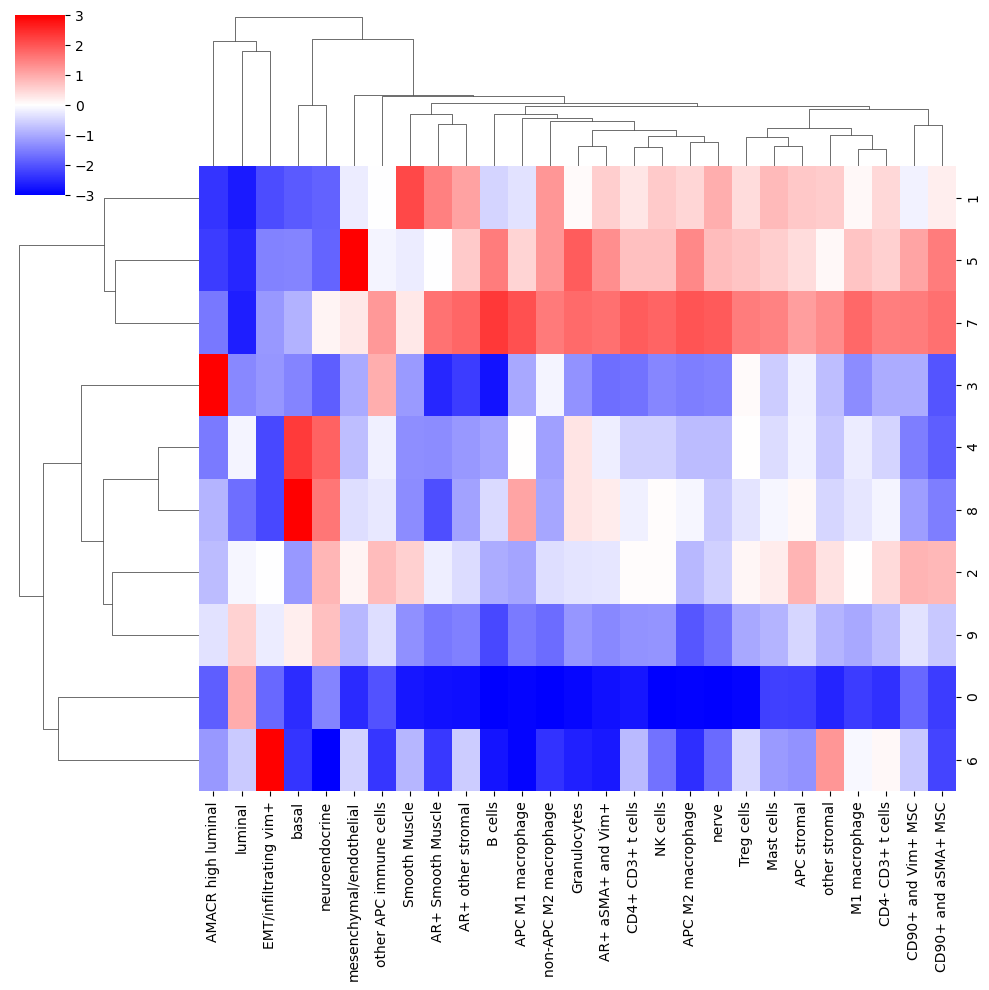

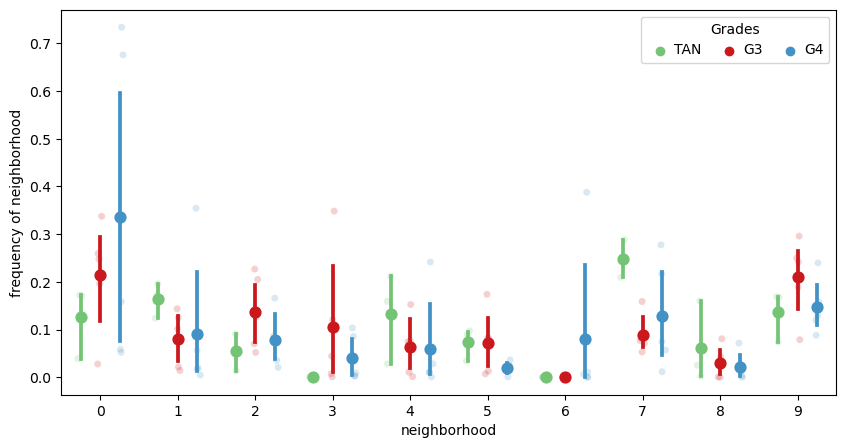

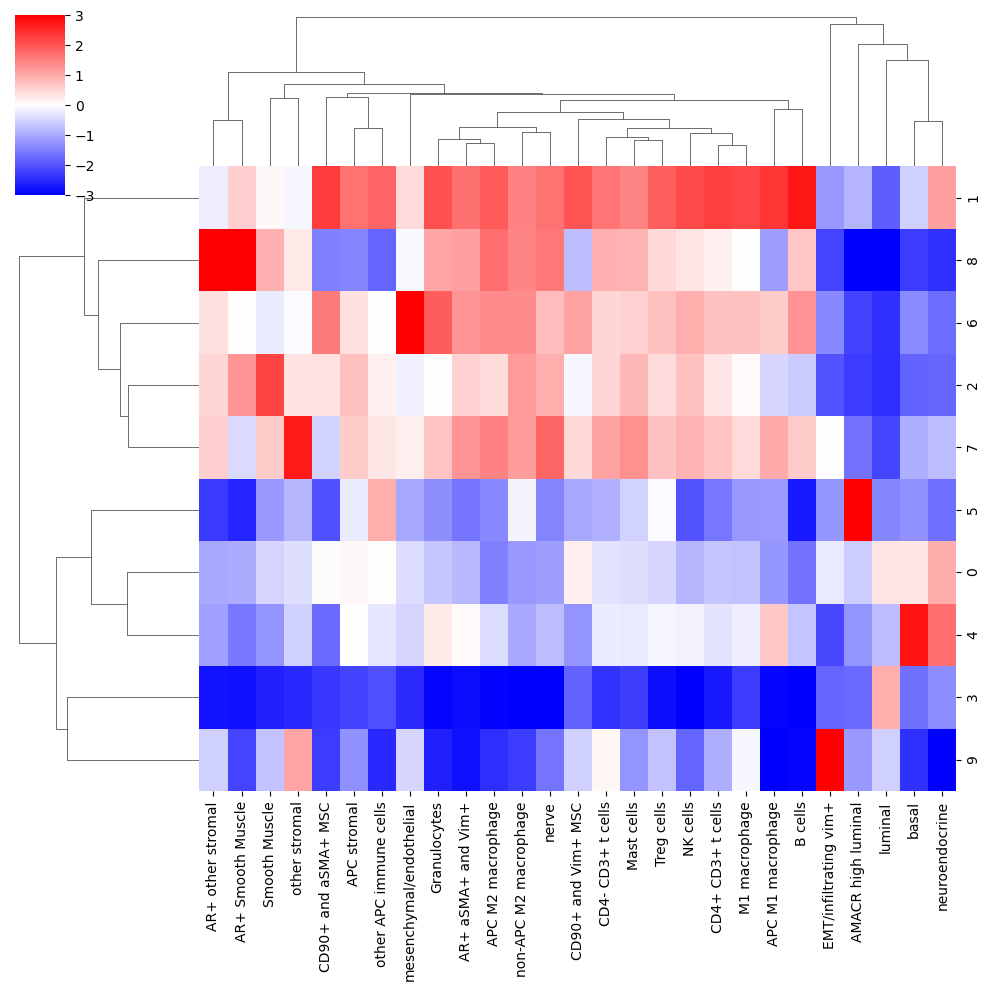

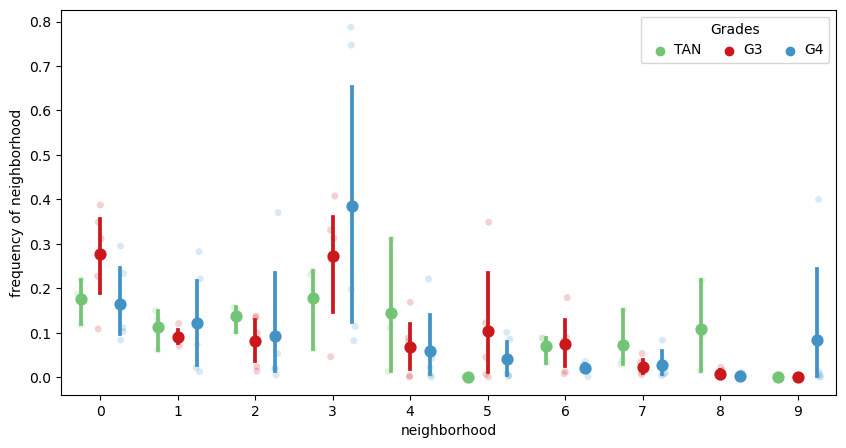

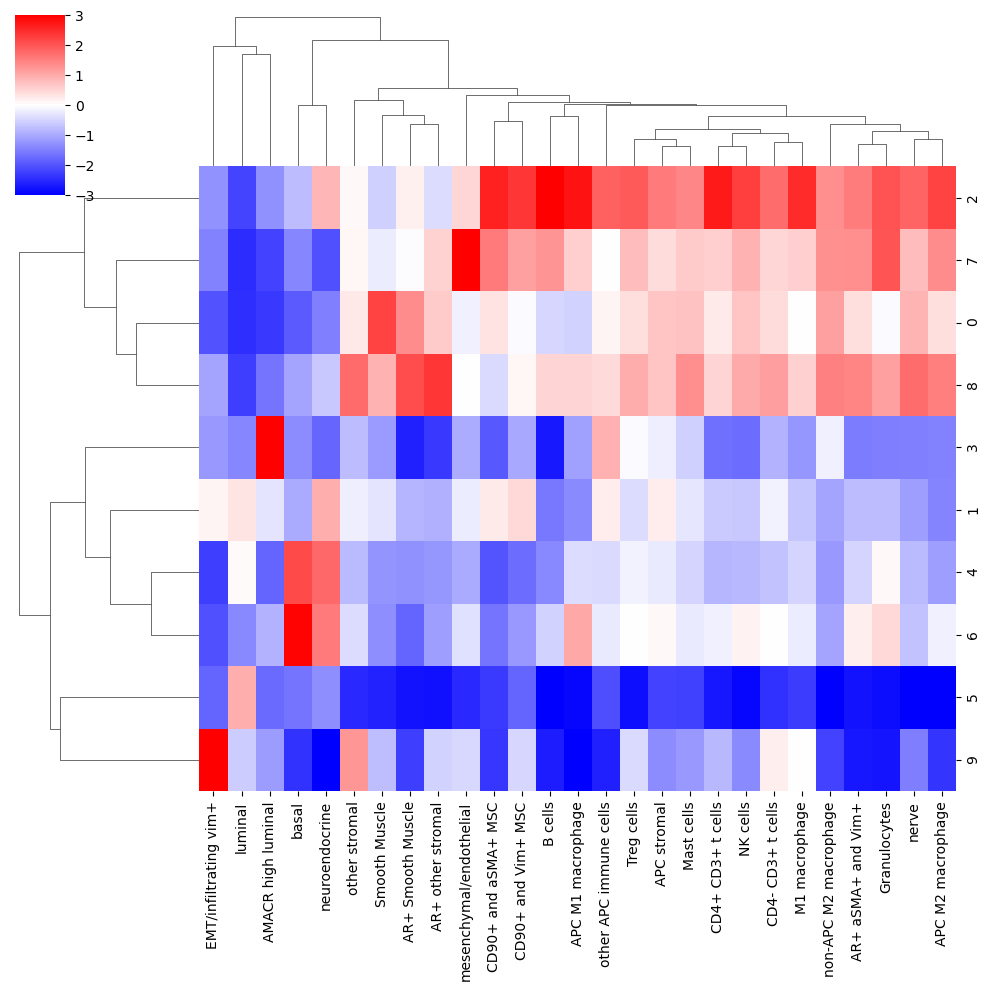

...

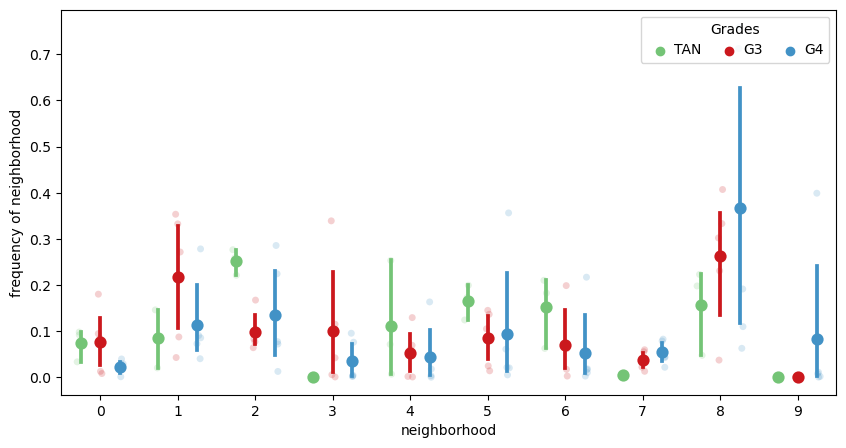

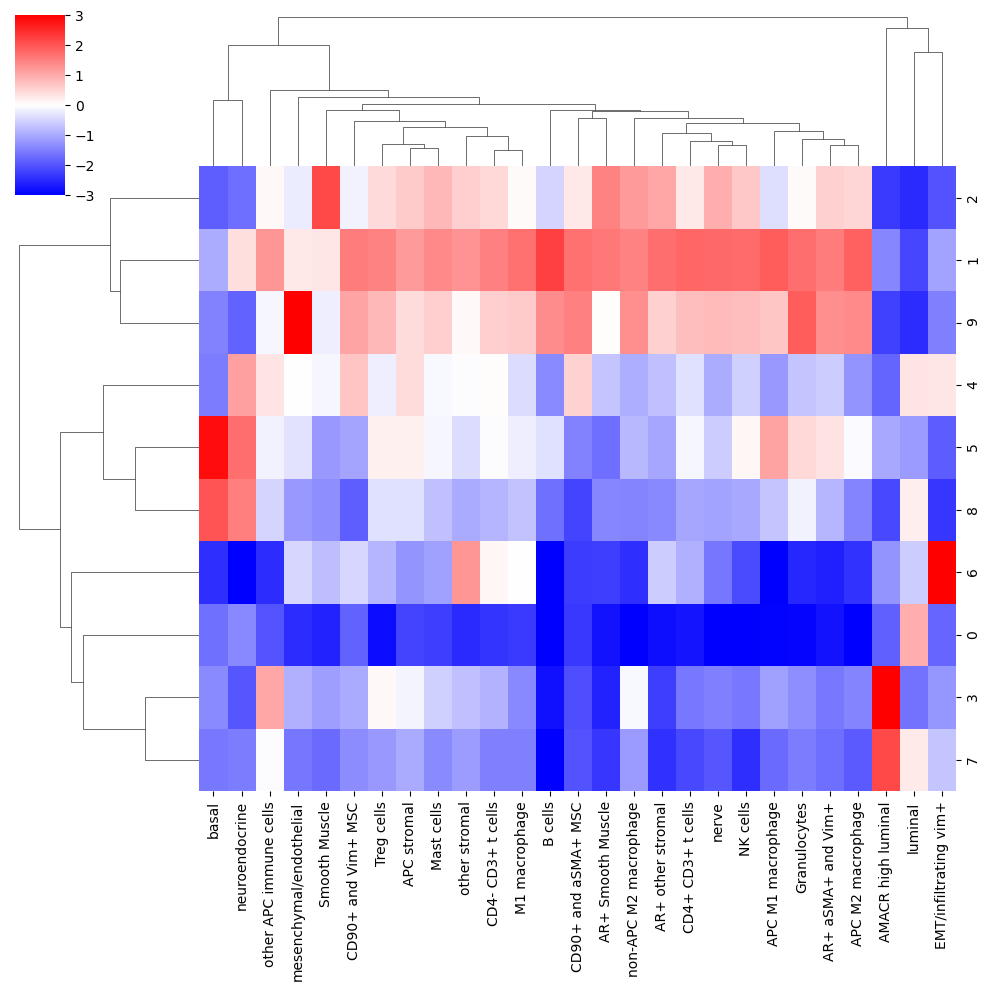

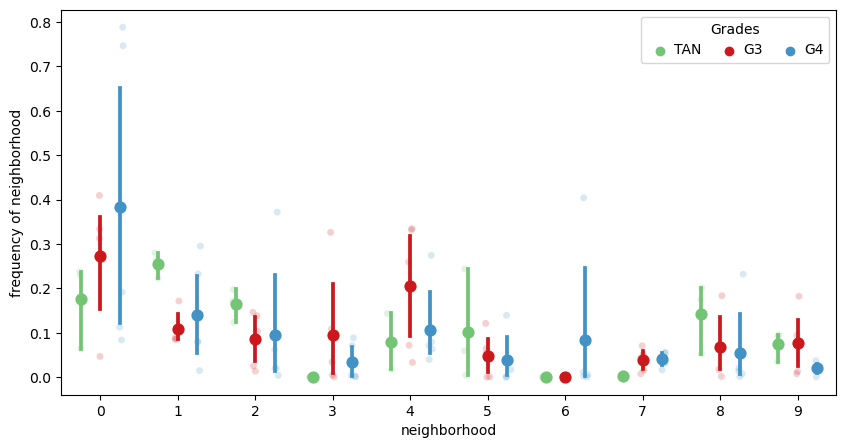

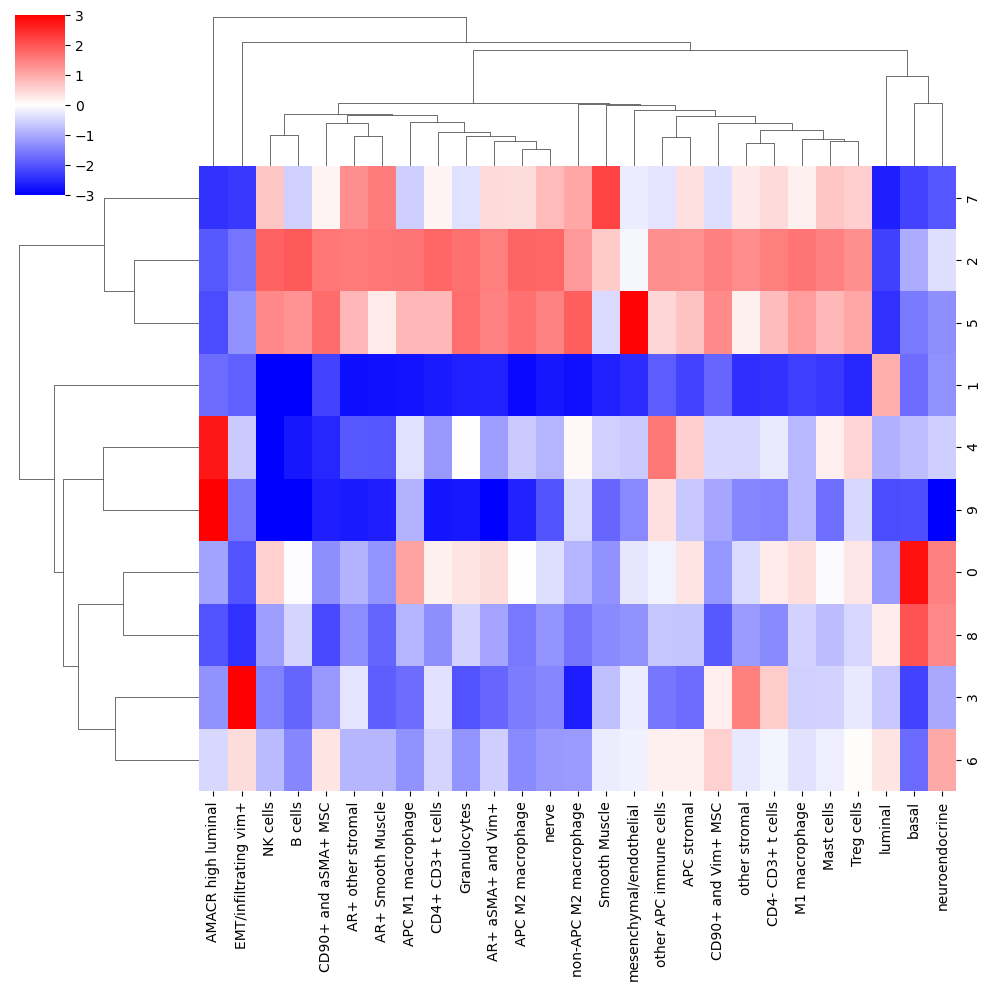

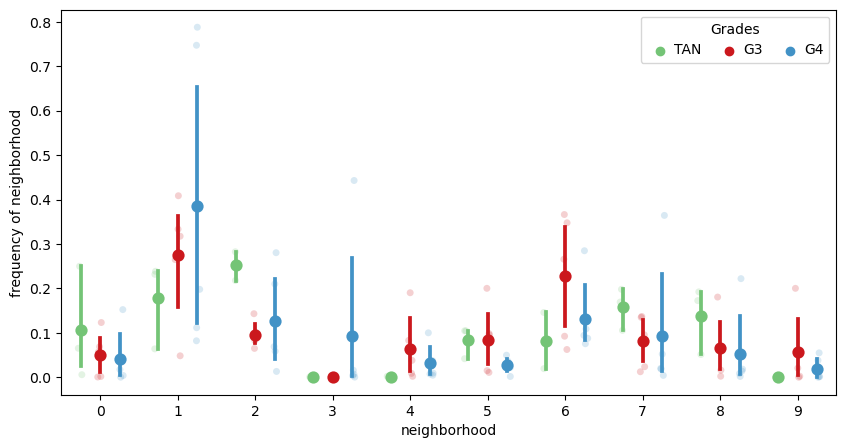

In [8]:
import random

for replication in range(100):
    
    random.seed(replication)
    ############
    #read in data and do some quick data rearrangement
    if file_type == 'pickle':
        cells = pd.read_pickle(path_to_data)
    if file_type == 'csv':
    #CA read data to be combined
        cells1 = pd.read_csv('G3-PCa_dfmerged_Nolan-names_0904.csv')
        cells1_90 = cells1.sample(frac=0.90)
        cells2 = pd.read_csv('G4-PCa_dfmerged_Nolan-names_0904.csv')
        cells2_90 = cells2.sample(frac=0.90)
        cells3 = pd.read_csv('TAN-PCa_dfmerged_Nolan-names_0904.csv')
        cells3_90 = cells3.sample(frac=0.90)
    
    #CA combine all data read with the next to line
    cells_3groups = [cells1_90, cells2_90, cells3_90]
    cells_all = pd.concat(cells_3groups)

    cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)

    cells = cells.reset_index() #Uncomment this line if you do any subsetting of dataframe such as removing dirt etc or will throw error at end of next next code block (cell 6)

    sum_cols = cells[cluster_col].unique()
    values = cells[sum_cols].values
    #############
    #find windows for each cell in each tissue region
    tissue_group = cells[[X,Y,reg]].groupby(reg)
    exps = list(cells[reg].unique())
    tissue_chunks = [(time.time(),exps.index(t),t,a) for t,indices in tissue_group.groups.items() for a in np.array_split(indices,1)] 
    tissues = [get_windows(job,n_neighbors) for job in tissue_chunks]
    #for each cell and its nearest neighbors, reshape and count the number of each cell type in those neighbors.
    out_dict = {}
    for k in ks:
        for neighbors,job in zip(tissues,tissue_chunks):

            chunk = np.arange(len(neighbors))#indices
            tissue_name = job[2]
            indices = job[3]
            window = values[neighbors[chunk,:k].flatten()].reshape(len(chunk),k,len(sum_cols)).sum(axis = 1)
            out_dict[(tissue_name,k)] = (window.astype(np.float16),indices)

    #concatenate the summed windows and combine into one dataframe for each window size tested.
    windows = {}
    for k in ks:
   
        window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
        window = window.loc[cells.index.values]
        window = pd.concat([cells[keep_cols],window],1)
        windows[k] = window
    k = 10
    n_neighborhoods = 10
    neighborhood_name = "neighborhood"+str(k)
    k_centroids = {}
    windows2 = windows[10]
    # windows2[cluster_col] = cells[cluster_col]

    km = MiniBatchKMeans(n_clusters = n_neighborhoods,random_state=0)

    labelskm = km.fit_predict(windows2[sum_cols].values)
    k_centroids[k] = km.cluster_centers_
    cells['neighborhood10'] = labelskm
    cells[neighborhood_name] = cells[neighborhood_name].astype('category')
    #['reg064_A','reg066_A','reg018_B','reg023_A']
    # this plot shows the types of cells (ClusterIDs) in the different niches 
    k_to_plot = 10
    niche_clusters = (k_centroids[k_to_plot])
    tissue_avgs = values.mean(axis = 0)
    fc = np.log2(((niche_clusters+tissue_avgs)/(niche_clusters+tissue_avgs).sum(axis = 1, keepdims = True))/tissue_avgs)
    fc = pd.DataFrame(fc,columns = sum_cols)
    #s=sns.clustermap(fc.loc[[0,2,3,4,5,6,7,8,9],cell_order], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = False)
    s=sns.clustermap(fc.loc[[0,1,2,3,4,5,6,7,8,9],], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = True)
    s.savefig("random90_ar_cn/celltypes_perniche_10_replication{}.pdf".format(replication))
    ar_cn=np.unique(np.concatenate((np.where(fc['AR+ aSMA+ and Vim+'] > 0),
               np.where(fc['AR+ Smooth Muscle'] > 0), 
               np.where(fc['AR+ other stromal'] > 0)), axis = None))
    #plot for each group and each patient the percent of total cells allocated to each neighborhood
    fc = cells.groupby(['patients','groups']).apply(lambda x: x['neighborhood10'].value_counts(sort = False,normalize = True))

    fc.columns = range(10)
    melt = pd.melt(fc.reset_index(),id_vars = ['patients','groups'])
    melt = melt.rename(columns = {'variable':'neighborhood','value':'frequency of neighborhood'})
    f,ax = plt.subplots(figsize = (10,5))
    sns.stripplot(data = melt, hue = 'groups',dodge = True,alpha = .2,x ='neighborhood', y ='frequency of neighborhood', palette=["#74c476", "#cb181d", "#4292c6"])
    sns.pointplot(data = melt, hue = 'groups',dodge = .5,join = False,x ='neighborhood', y ='frequency of neighborhood', palette=["#74c476", "#cb181d", "#4292c6"])

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:3], ['TAN', 'G3', 'G4'], title="Grades", #CA changed labels[:3] to ['TAN', 'G3', 'G4']
          handletextpad=0, columnspacing=1,
          loc="upper right", ncol=3, frameon=True)
    plt.savefig('random90_ar_cn/neighborhood_comparison_by_grade_replication{}.pdf'.format(replication))
    
    from scipy.stats import ttest_ind
    #t-test to evaluate if any neighborhood is enriched in one group TAN vs G3
    ttest_tan_g3 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_tan_g3.append(ttest_ind(n2[n2['groups']==0]['frequency of neighborhood'],n2[n2['groups']==3]['frequency of neighborhood']))
    ttest_tan_g3 = pd.DataFrame(ttest_tan_g3)
    ttest_tan_g3 = ttest_tan_g3.loc[ar_cn,:]
    ttest_tan_g3.to_csv('random90_ar_cn/ttest_tan_g3_replication{}.csv'.format(replication), index=False)
    
    #t-test to evaluate if any neighborhood is enriched in one group TAN vs G4
    ttest_tan_g4 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_tan_g4.append(ttest_ind(n2[n2['groups']==0]['frequency of neighborhood'],n2[n2['groups']==4]['frequency of neighborhood']))
    ttest_tan_g4 = pd.DataFrame(ttest_tan_g4)
    ttest_tan_g3= ttest_tan_g3.loc[ar_cn,:]
    ttest_tan_g4.to_csv('random90_ar_cn/ttest_tan_g4_replication{}.csv'.format(replication), index=False)
    
    #t-test to evaluate if any neighborhood is enriched in one group G3 vs G4
    ttest_g3_g4 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_g3_g4.append(ttest_ind(n2[n2['groups']==3]['frequency of neighborhood'],n2[n2['groups']==4]['frequency of neighborhood']))
    ttest_g3_g4 = pd.DataFrame(ttest_g3_g4)
    ttest_g3_g4 = ttest_g3_g4.loc[ar_cn,:]
    ttest_g3_g4.to_csv('random90_ar_cn/ttest_g3_g4_replication{}.csv'.format(replication), index=False)  